In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 5) remove checkpoints
# import os; _ = [os.remove(p) for p in __import__("glob").glob("libs/.ipynb_checkpoints/*.py") if os.path.exists(p)]


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [4]:
importlib.reload(params) #####
importlib.reload(strategies) #####
strategies.reset_globals() # reset global variables before calling the strategies functions

# df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_actions(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        reset_peak      = params.reset_peak_tick,
        rsi_thresh      = params.rsi_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            invest_frac = params.invest_frac_tick,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/622 [00:00<?, ?it/s]

Loop finished. Days simulated: 622



                                                  ******* Performance for 2024-06-03 *******

INTRADAY:
  shares(395); [ask_buy=193.359, fee_buy=0.004, pos_amnt_buy=76378.252]; [bid_sell=194.061, fee_sell=0.018, pos_amnt_sell=76646.877]; PNL=268.625
TRADES:
  Tr[1]: Time(14:30)Ask(193.359)Bid(193.281)Act(Buy)Shrs(1)Pos(280); CashTr(-193.363)=Cost(-193.359)-Fee(-0.004); P&L(59000.521)=CashTot(4881.747)+PosAmt(54118.774)
  Tr[2]: Time(14:31)Ask(192.819)Bid(192.741)Act(Buy)Shrs(1)Pos(281); CashTr(-192.823)=Cost(-192.819)-Fee(-0.004); P&L(58849.27)=CashTot(4688.924)+PosAmt(54160.346)
  Tr[3]: Time(14:32)Ask(192.799)Bid(192.721)Act(Buy)Shrs(1)Pos(282); CashTr(-192.803)=Cost(-192.799)-Fee(-0.004); P&L(58843.57)=CashTot(4496.122)+PosAmt(54347.448)
  Tr[4]: Time(14:33)Ask(192.819)Bid(192.741)Act(Buy)Shrs(1)Pos(283); CashTr(-192.823)=Cost(-192.819)-Fee(-0.004); P&L(58849.128)=CashTot(4303.299)+PosAmt(54545.829)
  Tr[5]: Time(14:34)Ask(193.169)Bid(193.091)Act(Buy)Shrs(1)Pos(284); CashTr(-193.17


                                                  ******* Performance for 2024-06-04 *******

INTRADAY:
  shares(393); [ask_buy=194.919, fee_buy=0.004, pos_amnt_buy=76604.73]; [bid_sell=194.071, fee_sell=0.018, pos_amnt_sell=76262.721]; PNL=-342.009
TRADES:
  Tr[1]: Time(14:30)Ask(194.919)Bid(194.841)Act(Buy)Shrs(3)Pos(230); CashTr(-584.769)=Cost(-584.757)-Fee(-0.012); P&L(59479.746)=CashTot(14666.31)+PosAmt(44813.436)
  Tr[2]: Time(14:31)Ask(194.804)Bid(194.726)Act(Buy)Shrs(3)Pos(233); CashTr(-584.424)=Cost(-584.412)-Fee(-0.012); P&L(59453.055)=CashTot(14081.886)+PosAmt(45371.169)
  Tr[3]: Time(14:32)Ask(194.634)Bid(194.556)Act(Buy)Shrs(3)Pos(236); CashTr(-583.914)=Cost(-583.902)-Fee(-0.012); P&L(59413.208)=CashTot(13497.972)+PosAmt(45915.235)
  Tr[4]: Time(14:33)Ask(194.169)Bid(194.091)Act(Buy)Shrs(2)Pos(238); CashTr(-388.345)=Cost(-388.337)-Fee(-0.008); P&L(59303.303)=CashTot(13109.627)+PosAmt(46193.676)
  Tr[5]: Time(14:34)Ask(193.939)Bid(193.861)Act(Buy)Shrs(2)Pos(240); CashTr(-3


                                                  ******* Performance for 2024-06-05 *******

INTRADAY:
  shares(389); [ask_buy=195.75, fee_buy=0.004, pos_amnt_buy=76148.167]; [bid_sell=195.481, fee_sell=0.018, pos_amnt_sell=76034.878]; PNL=-113.289
TRADES:
  Tr[1]: Time(14:30)Ask(195.75)Bid(195.671)Act(Buy)Shrs(7)Pos(68); CashTr(-1370.275)=Cost(-1370.247)-Fee(-0.028); P&L(59093.268)=CashTot(45787.616)+PosAmt(13305.652)
  Tr[2]: Time(14:31)Ask(196.091)Bid(196.012)Act(Buy)Shrs(7)Pos(75); CashTr(-1372.662)=Cost(-1372.634)-Fee(-0.028); P&L(59115.861)=CashTot(44414.954)+PosAmt(14700.907)
  Tr[3]: Time(14:32)Ask(196.254)Bid(196.176)Act(Buy)Shrs(7)Pos(82); CashTr(-1373.808)=Cost(-1373.78)-Fee(-0.028); P&L(59127.558)=CashTot(43041.146)+PosAmt(16086.412)
  Tr[4]: Time(14:33)Ask(196.099)Bid(196.021)Act(Buy)Shrs(6)Pos(88); CashTr(-1176.619)=Cost(-1176.595)-Fee(-0.024); P&L(59114.356)=CashTot(41864.527)+PosAmt(17249.829)
  Tr[5]: Time(14:34)Ask(195.519)Bid(195.441)Act(Buy)Shrs(6)Pos(94); CashTr(


                                                  ******* Performance for 2024-06-06 *******

INTRADAY:
  shares(387); [ask_buy=196.169, fee_buy=0.004, pos_amnt_buy=75919.038]; [bid_sell=194.141, fee_sell=0.018, pos_amnt_sell=75125.488]; PNL=-793.55
TRADES:
  Tr[1]: Time(14:30)Ask(196.169)Bid(196.091)Act(Sell)Shrs(5)Pos(9); CashTr(980.361)=Cost(980.454)-Fee(-0.092); P&L(58768.192)=CashTot(57003.375)+PosAmt(1764.817)
  Tr[2]: Time(14:31)Ask(196.269)Bid(196.191)Act(Buy)Shrs(8)Pos(17); CashTr(-1570.186)=Cost(-1570.154)-Fee(-0.032); P&L(58768.432)=CashTot(55433.189)+PosAmt(3335.243)
  Tr[3]: Time(14:32)Ask(196.147)Bid(196.069)Act(Buy)Shrs(8)Pos(25); CashTr(-1569.211)=Cost(-1569.179)-Fee(-0.032); P&L(58765.702)=CashTot(53863.978)+PosAmt(4901.724)
  Tr[4]: Time(14:33)Ask(195.939)Bid(195.861)Act(Buy)Shrs(8)Pos(33); CashTr(-1567.545)=Cost(-1567.513)-Fee(-0.032); P&L(58759.839)=CashTot(52296.432)+PosAmt(6463.407)
  Tr[5]: Time(14:34)Ask(195.809)Bid(195.731)Act(Buy)Shrs(8)Pos(41); CashTr(-1566.


                                                  ******* Performance for 2024-06-07 *******

INTRADAY:
  shares(384); [ask_buy=195.559, fee_buy=0.004, pos_amnt_buy=75096.232]; [bid_sell=196.851, fee_sell=0.019, pos_amnt_sell=75583.528]; PNL=487.296
TRADES:
  Tr[1]: Time(14:30)Ask(195.559)Bid(195.481)Act(Buy)Shrs(8)Pos(8); CashTr(-1564.505)=Cost(-1564.473)-Fee(-0.032); P&L(58521.767)=CashTot(56957.92)+PosAmt(1563.847)
  Tr[2]: Time(14:31)Ask(195.699)Bid(195.621)Act(Buy)Shrs(8)Pos(16); CashTr(-1565.625)=Cost(-1565.593)-Fee(-0.032); P&L(58522.229)=CashTot(55392.295)+PosAmt(3129.934)
  Tr[3]: Time(14:32)Ask(195.109)Bid(195.031)Act(Buy)Shrs(8)Pos(24); CashTr(-1560.904)=Cost(-1560.872)-Fee(-0.032); P&L(58512.134)=CashTot(53831.391)+PosAmt(4680.744)
  Tr[4]: Time(14:33)Ask(195.274)Bid(195.196)Act(Buy)Shrs(8)Pos(32); CashTr(-1562.224)=Cost(-1562.192)-Fee(-0.032); P&L(58515.437)=CashTot(52269.166)+PosAmt(6246.27)
  Tr[5]: Time(14:34)Ask(195.029)Bid(194.951)Act(Buy)Shrs(8)Pos(40); CashTr(-1560


                                                  ******* Performance for 2024-06-10 *******

INTRADAY:
  shares(383); [ask_buy=197.059, fee_buy=0.004, pos_amnt_buy=75475.284]; [bid_sell=192.981, fee_sell=0.018, pos_amnt_sell=73904.817]; PNL=-1570.467
TRADES:
  Tr[1]: Time(14:30)Ask(197.059)Bid(196.981)Act(Sell)Shrs(78)Pos(189); CashTr(15363.042)=Cost(15364.486)-Fee(-1.445); P&L(58553.208)=CashTot(21323.876)+PosAmt(37229.333)
  Tr[2]: Time(14:31)Ask(196.793)Bid(196.714)Act(Sell)Shrs(55)Pos(134); CashTr(10818.26)=Cost(10819.278)-Fee(-1.018); P&L(58501.832)=CashTot(32142.136)+PosAmt(26359.696)
  Tr[3]: Time(14:32)Ask(196.604)Bid(196.526)Act(Sell)Shrs(39)Pos(95); CashTr(7663.78)=Cost(7664.502)-Fee(-0.722); P&L(58475.856)=CashTot(39805.915)+PosAmt(18669.94)
  Tr[4]: Time(14:34)Ask(196.859)Bid(196.781)Act(Sell)Shrs(28)Pos(67); CashTr(5509.339)=Cost(5509.858)-Fee(-0.518); P&L(58499.557)=CashTot(45315.255)+PosAmt(13184.303)
  Tr[5]: Time(14:35)Ask(196.63)Bid(196.551)Act(Sell)Shrs(20)Pos(47);


                                                  ******* Performance for 2024-06-11 *******

INTRADAY:
  shares(380); [ask_buy=194.344, fee_buy=0.004, pos_amnt_buy=73852.187]; [bid_sell=207.109, fee_sell=0.019, pos_amnt_sell=78694.131]; PNL=4841.944
TRADES:
  Tr[1]: Time(14:30)Ask(194.344)Bid(194.266)Act(Buy)Shrs(8)Pos(24); CashTr(-1554.783)=Cost(-1554.751)-Fee(-0.032); P&L(57935.664)=CashTot(53273.277)+PosAmt(4662.387)
  Tr[2]: Time(14:31)Ask(194.429)Bid(194.351)Act(Buy)Shrs(8)Pos(32); CashTr(-1555.463)=Cost(-1555.431)-Fee(-0.032); P&L(57937.05)=CashTot(51717.814)+PosAmt(6219.236)
  Tr[3]: Time(14:32)Ask(195.14)Bid(195.062)Act(Buy)Shrs(8)Pos(40); CashTr(-1561.152)=Cost(-1561.12)-Fee(-0.032); P&L(57959.141)=CashTot(50156.661)+PosAmt(7802.479)
  Tr[4]: Time(14:33)Ask(195.569)Bid(195.491)Act(Buy)Shrs(7)Pos(47); CashTr(-1369.012)=Cost(-1368.984)-Fee(-0.028); P&L(57975.722)=CashTot(48787.65)+PosAmt(9188.072)
  Tr[5]: Time(14:34)Ask(196.044)Bid(195.966)Act(Buy)Shrs(7)Pos(54); CashTr(-1372


                                                  ******* Performance for 2024-06-12 *******

INTRADAY:
  shares(378); [ask_buy=207.877, fee_buy=0.004, pos_amnt_buy=78578.854]; [bid_sell=213.357, fee_sell=0.019, pos_amnt_sell=80641.925]; PNL=2063.07
TRADES:
  Tr[1]: Time(14:30)Ask(207.877)Bid(207.793)Act(Buy)Shrs(3)Pos(204); CashTr(-623.642)=Cost(-623.63)-Fee(-0.012); P&L(59565.588)=CashTot(17175.727)+PosAmt(42389.86)
  Tr[2]: Time(14:31)Ask(208.172)Bid(208.088)Act(Buy)Shrs(3)Pos(207); CashTr(-624.527)=Cost(-624.515)-Fee(-0.012); P&L(59625.494)=CashTot(16551.201)+PosAmt(43074.293)
  Tr[3]: Time(14:32)Ask(208.482)Bid(208.398)Act(Buy)Shrs(3)Pos(210); CashTr(-625.457)=Cost(-625.445)-Fee(-0.012); P&L(59689.389)=CashTot(15925.744)+PosAmt(43763.646)
  Tr[4]: Time(14:33)Ask(209.124)Bid(209.041)Act(Buy)Shrs(3)Pos(213); CashTr(-627.385)=Cost(-627.373)-Fee(-0.012); P&L(59824.024)=CashTot(15298.359)+PosAmt(44525.666)
  Tr[5]: Time(14:34)Ask(209.822)Bid(209.738)Act(Buy)Shrs(3)Pos(216); CashTr(-62


                                                  ******* Performance for 2024-06-13 *******

INTRADAY:
  shares(374); [ask_buy=215.273, fee_buy=0.004, pos_amnt_buy=80513.615]; [bid_sell=214.187, fee_sell=0.019, pos_amnt_sell=80098.922]; PNL=-414.693
TRADES:
  Tr[1]: Time(14:30)Ask(215.273)Bid(215.187)Act(Buy)Shrs(8)Pos(8); CashTr(-1722.216)=Cost(-1722.184)-Fee(-0.032); P&L(62043.108)=CashTot(60321.613)+PosAmt(1721.496)
  Tr[2]: Time(14:31)Ask(215.013)Bid(214.927)Act(Buy)Shrs(8)Pos(16); CashTr(-1720.136)=Cost(-1720.104)-Fee(-0.032); P&L(62040.309)=CashTot(58601.477)+PosAmt(3438.832)
  Tr[3]: Time(14:32)Ask(215.348)Bid(215.262)Act(Buy)Shrs(8)Pos(24); CashTr(-1722.816)=Cost(-1722.784)-Fee(-0.032); P&L(62044.947)=CashTot(56878.66)+PosAmt(5166.287)
  Tr[4]: Time(14:33)Ask(215.983)Bid(215.897)Act(Buy)Shrs(8)Pos(32); CashTr(-1727.898)=Cost(-1727.866)-Fee(-0.032); P&L(62059.461)=CashTot(55150.763)+PosAmt(6908.698)
  Tr[5]: Time(14:34)Ask(215.039)Bid(214.953)Act(Buy)Shrs(7)Pos(39); CashTr(-15


                                                  ******* Performance for 2024-06-14 *******

INTRADAY:
  shares(374); [ask_buy=214.113, fee_buy=0.004, pos_amnt_buy=80079.688]; [bid_sell=212.448, fee_sell=0.019, pos_amnt_sell=79448.307]; PNL=-631.382
TRADES:
  Tr[1]: Time(14:30)Ask(214.113)Bid(214.027)Act(Buy)Shrs(2)Pos(248); CashTr(-428.234)=Cost(-428.226)-Fee(-0.008); P&L(61677.774)=CashTot(8599.032)+PosAmt(53078.742)
  Tr[2]: Time(14:31)Ask(213.678)Bid(213.592)Act(Buy)Shrs(2)Pos(250); CashTr(-427.363)=Cost(-427.355)-Fee(-0.008); P&L(61569.737)=CashTot(8171.668)+PosAmt(53398.068)
  Tr[3]: Time(14:32)Ask(213.653)Bid(213.567)Act(Buy)Shrs(2)Pos(252); CashTr(-427.313)=Cost(-427.305)-Fee(-0.008); P&L(61563.309)=CashTot(7744.355)+PosAmt(53818.954)
  Tr[4]: Time(14:33)Ask(214.718)Bid(214.632)Act(Buy)Shrs(2)Pos(254); CashTr(-429.444)=Cost(-429.436)-Fee(-0.008); P&L(61831.455)=CashTot(7314.911)+PosAmt(54516.545)
  Tr[5]: Time(14:34)Ask(214.568)Bid(214.482)Act(Buy)Shrs(2)Pos(256); CashTr(-429


                                                  ******* Performance for 2024-06-17 *******

INTRADAY:
  shares(371); [ask_buy=213.878, fee_buy=0.004, pos_amnt_buy=79350.136]; [bid_sell=216.787, fee_sell=0.019, pos_amnt_sell=80420.802]; PNL=1070.667
TRADES:
  Tr[1]: Time(14:30)Ask(213.878)Bid(213.792)Act(Buy)Shrs(6)Pos(71); CashTr(-1283.291)=Cost(-1283.267)-Fee(-0.024); P&L(61083.647)=CashTot(45904.398)+PosAmt(15179.249)
  Tr[2]: Time(14:31)Ask(214.213)Bid(214.127)Act(Buy)Shrs(6)Pos(77); CashTr(-1285.301)=Cost(-1285.277)-Fee(-0.024); P&L(61106.889)=CashTot(44619.097)+PosAmt(16487.792)
  Tr[3]: Time(14:32)Ask(214.133)Bid(214.047)Act(Buy)Shrs(6)Pos(83); CashTr(-1284.821)=Cost(-1284.797)-Fee(-0.024); P&L(61100.192)=CashTot(43334.276)+PosAmt(17765.916)
  Tr[4]: Time(14:33)Ask(213.413)Bid(213.327)Act(Buy)Shrs(6)Pos(89); CashTr(-1280.5)=Cost(-1280.476)-Fee(-0.024); P&L(61039.908)=CashTot(42053.776)+PosAmt(18986.132)
  Tr[5]: Time(14:34)Ask(213.036)Bid(212.951)Act(Sell)Shrs(26)Pos(63); Cash


                                                  ******* Performance for 2024-06-18 *******

INTRADAY:
  shares(369); [ask_buy=217.543, fee_buy=0.004, pos_amnt_buy=80275.027]; [bid_sell=213.937, fee_sell=0.019, pos_amnt_sell=78935.851]; PNL=-1339.176
TRADES:
  Tr[1]: Time(14:30)Ask(217.543)Bid(217.457)Act(Buy)Shrs(8)Pos(8); CashTr(-1740.38)=Cost(-1740.348)-Fee(-0.032); P&L(61029.118)=CashTot(59289.466)+PosAmt(1739.652)
  Tr[2]: Time(14:31)Ask(217.934)Bid(217.846)Act(Buy)Shrs(8)Pos(16); CashTr(-1743.501)=Cost(-1743.469)-Fee(-0.032); P&L(61031.508)=CashTot(57545.966)+PosAmt(3485.543)
  Tr[3]: Time(14:32)Ask(217.864)Bid(217.776)Act(Buy)Shrs(8)Pos(24); CashTr(-1742.941)=Cost(-1742.909)-Fee(-0.032); P&L(61029.659)=CashTot(55803.025)+PosAmt(5226.634)
  Tr[4]: Time(14:33)Ask(218.016)Bid(217.929)Act(Buy)Shrs(7)Pos(31); CashTr(-1526.139)=Cost(-1526.111)-Fee(-0.028); P&L(61032.673)=CashTot(54276.886)+PosAmt(6755.787)
  Tr[5]: Time(14:34)Ask(218.494)Bid(218.406)Act(Buy)Shrs(7)Pos(38); CashTr(-1


                                                  ******* Performance for 2024-06-20 *******

INTRADAY:
  shares(368); [ask_buy=213.943, fee_buy=0.004, pos_amnt_buy=78732.415]; [bid_sell=209.748, fee_sell=0.019, pos_amnt_sell=77180.357]; PNL=-1552.058
TRADES:
  Tr[1]: Time(14:30)Ask(213.943)Bid(213.857)Act(Buy)Shrs(7)Pos(50); CashTr(-1497.627)=Cost(-1497.599)-Fee(-0.028); P&L(60603.712)=CashTot(49910.851)+PosAmt(10692.861)
  Tr[2]: Time(14:31)Ask(213.31)Bid(213.225)Act(Buy)Shrs(7)Pos(57); CashTr(-1493.199)=Cost(-1493.171)-Fee(-0.028); P&L(60571.468)=CashTot(48417.652)+PosAmt(12153.816)
  Tr[3]: Time(14:32)Ask(212.783)Bid(212.697)Act(Sell)Shrs(17)Pos(40); CashTr(3615.536)=Cost(3615.857)-Fee(-0.321); P&L(60541.085)=CashTot(52033.187)+PosAmt(8507.898)
  Tr[4]: Time(14:33)Ask(212.412)Bid(212.328)Act(Sell)Shrs(12)Pos(28); CashTr(2547.704)=Cost(2547.93)-Fee(-0.226); P&L(60526.062)=CashTot(54580.891)+PosAmt(5945.171)
  Tr[5]: Time(14:37)Ask(213.453)Bid(213.367)Act(Sell)Shrs(9)Pos(19); CashTr


                                                  ******* Performance for 2024-06-21 *******

INTRADAY:
  shares(366); [ask_buy=210.842, fee_buy=0.004, pos_amnt_buy=77169.695]; [bid_sell=208.108, fee_sell=0.019, pos_amnt_sell=76160.792]; PNL=-1008.903
TRADES:
  Tr[1]: Time(14:30)Ask(210.842)Bid(210.758)Act(Sell)Shrs(7)Pos(17); CashTr(1475.173)=Cost(1475.305)-Fee(-0.132); P&L(60245.687)=CashTot(56662.803)+PosAmt(3582.883)
  Tr[2]: Time(14:31)Ask(210.517)Bid(210.433)Act(Sell)Shrs(5)Pos(12); CashTr(1052.07)=Cost(1052.165)-Fee(-0.094); P&L(60240.069)=CashTot(57714.874)+PosAmt(2525.195)
  Tr[3]: Time(14:33)Ask(211.518)Bid(211.434)Act(Sell)Shrs(4)Pos(8); CashTr(845.659)=Cost(845.735)-Fee(-0.075); P&L(60252.003)=CashTot(58560.533)+PosAmt(1691.47)
  Tr[4]: Time(14:34)Ask(211.152)Bid(211.068)Act(Sell)Shrs(3)Pos(5); CashTr(633.147)=Cost(633.203)-Fee(-0.057); P&L(60249.019)=CashTot(59193.68)+PosAmt(1055.339)
  Tr[5]: Time(14:35)Ask(210.702)Bid(210.618)Act(Sell)Shrs(2)Pos(3); CashTr(421.198)=Cost


                                                  ******* Performance for 2024-06-24 *******

INTRADAY:
  shares(367); [ask_buy=207.251, fee_buy=0.004, pos_amnt_buy=76062.747]; [bid_sell=208.568, fee_sell=0.019, pos_amnt_sell=76537.664]; PNL=474.917
TRADES:
  Tr[1]: Time(14:30)Ask(207.251)Bid(207.169)Act(Sell)Shrs(2)Pos(3); CashTr(414.3)=Cost(414.337)-Fee(-0.038); P&L(59817.19)=CashTot(59195.685)+PosAmt(621.506)
  Tr[2]: Time(14:32)Ask(207.421)Bid(207.338)Act(Sell)Shrs(1)Pos(2); CashTr(207.319)=Cost(207.338)-Fee(-0.019); P&L(59817.679)=CashTot(59403.004)+PosAmt(414.676)
  Tr[3]: Time(14:37)Ask(208.087)Bid(208.003)Act(Buy)Shrs(8)Pos(10); CashTr(-1664.725)=Cost(-1664.693)-Fee(-0.032); P&L(59818.313)=CashTot(57738.279)+PosAmt(2080.034)
  Tr[4]: Time(14:38)Ask(207.291)Bid(207.209)Act(Sell)Shrs(3)Pos(7); CashTr(621.569)=Cost(621.626)-Fee(-0.056); P&L(59810.308)=CashTot(58359.848)+PosAmt(1450.46)
  Tr[5]: Time(14:39)Ask(206.908)Bid(206.826)Act(Sell)Shrs(3)Pos(4); CashTr(620.42)=Cost(620.477


                                                  ******* Performance for 2024-06-25 *******

INTRADAY:
  shares(364); [ask_buy=210.077, fee_buy=0.004, pos_amnt_buy=76469.487]; [bid_sell=209.333, fee_sell=0.019, pos_amnt_sell=76190.413]; PNL=-279.073
TRADES:
  Tr[1]: Time(14:30)Ask(210.077)Bid(209.993)Act(Sell)Shrs(5)Pos(10); CashTr(1049.871)=Cost(1049.965)-Fee(-0.094); P&L(60531.733)=CashTot(58431.803)+PosAmt(2099.93)
  Tr[2]: Time(14:32)Ask(210.712)Bid(210.628)Act(Buy)Shrs(8)Pos(18); CashTr(-1685.729)=Cost(-1685.697)-Fee(-0.032); P&L(60537.376)=CashTot(56746.074)+PosAmt(3791.302)
  Tr[3]: Time(14:33)Ask(210.392)Bid(210.308)Act(Buy)Shrs(8)Pos(26); CashTr(-1683.169)=Cost(-1683.137)-Fee(-0.032); P&L(60530.912)=CashTot(55062.905)+PosAmt(5468.006)
  Tr[4]: Time(14:34)Ask(210.562)Bid(210.478)Act(Buy)Shrs(8)Pos(34); CashTr(-1684.529)=Cost(-1684.497)-Fee(-0.032); P&L(60534.625)=CashTot(53378.377)+PosAmt(7156.248)
  Tr[5]: Time(14:35)Ask(210.512)Bid(210.428)Act(Buy)Shrs(7)Pos(41); CashTr(-14


                                                  ******* Performance for 2024-06-26 *******

INTRADAY:
  shares(360); [ask_buy=211.472, fee_buy=0.004, pos_amnt_buy=76131.463]; [bid_sell=213.152, fee_sell=0.019, pos_amnt_sell=76728.049]; PNL=596.587
TRADES:
  Tr[1]: Time(14:30)Ask(211.472)Bid(211.388)Act(Buy)Shrs(8)Pos(8); CashTr(-1691.81)=Cost(-1691.778)-Fee(-0.032); P&L(60270.186)=CashTot(58579.084)+PosAmt(1691.102)
  Tr[2]: Time(14:31)Ask(211.407)Bid(211.323)Act(Buy)Shrs(8)Pos(16); CashTr(-1691.29)=Cost(-1691.258)-Fee(-0.032); P&L(60268.958)=CashTot(56887.794)+PosAmt(3381.164)
  Tr[3]: Time(14:32)Ask(211.832)Bid(211.747)Act(Buy)Shrs(8)Pos(24); CashTr(-1694.688)=Cost(-1694.656)-Fee(-0.032); P&L(60275.04)=CashTot(55193.107)+PosAmt(5081.934)
  Tr[4]: Time(14:33)Ask(212.182)Bid(212.098)Act(Buy)Shrs(7)Pos(31); CashTr(-1485.305)=Cost(-1485.277)-Fee(-0.028); P&L(60282.826)=CashTot(53707.802)+PosAmt(6575.025)
  Tr[5]: Time(14:34)Ask(212.142)Bid(212.058)Act(Buy)Shrs(7)Pos(38); CashTr(-1485.


                                                  ******* Performance for 2024-06-27 *******

INTRADAY:
  shares(357); [ask_buy=214.903, fee_buy=0.004, pos_amnt_buy=76721.789]; [bid_sell=213.807, fee_sell=0.019, pos_amnt_sell=76322.432]; PNL=-399.357
TRADES:
  Tr[1]: Time(14:30)Ask(214.903)Bid(214.817)Act(Buy)Shrs(8)Pos(21); CashTr(-1719.256)=Cost(-1719.224)-Fee(-0.032); P&L(60656.97)=CashTot(56145.812)+PosAmt(4511.158)
  Tr[2]: Time(14:31)Ask(214.863)Bid(214.777)Act(Buy)Shrs(8)Pos(29); CashTr(-1718.936)=Cost(-1718.904)-Fee(-0.032); P&L(60655.411)=CashTot(54426.877)+PosAmt(6228.534)
  Tr[3]: Time(14:32)Ask(215.073)Bid(214.987)Act(Buy)Shrs(7)Pos(36); CashTr(-1505.539)=Cost(-1505.511)-Fee(-0.028); P&L(60660.87)=CashTot(52921.338)+PosAmt(7739.532)
  Tr[4]: Time(14:33)Ask(215.203)Bid(215.117)Act(Buy)Shrs(7)Pos(43); CashTr(-1506.449)=Cost(-1506.421)-Fee(-0.028); P&L(60664.918)=CashTot(51414.889)+PosAmt(9250.03)
  Tr[5]: Time(14:34)Ask(215.143)Bid(215.057)Act(Buy)Shrs(7)Pos(50); CashTr(-150

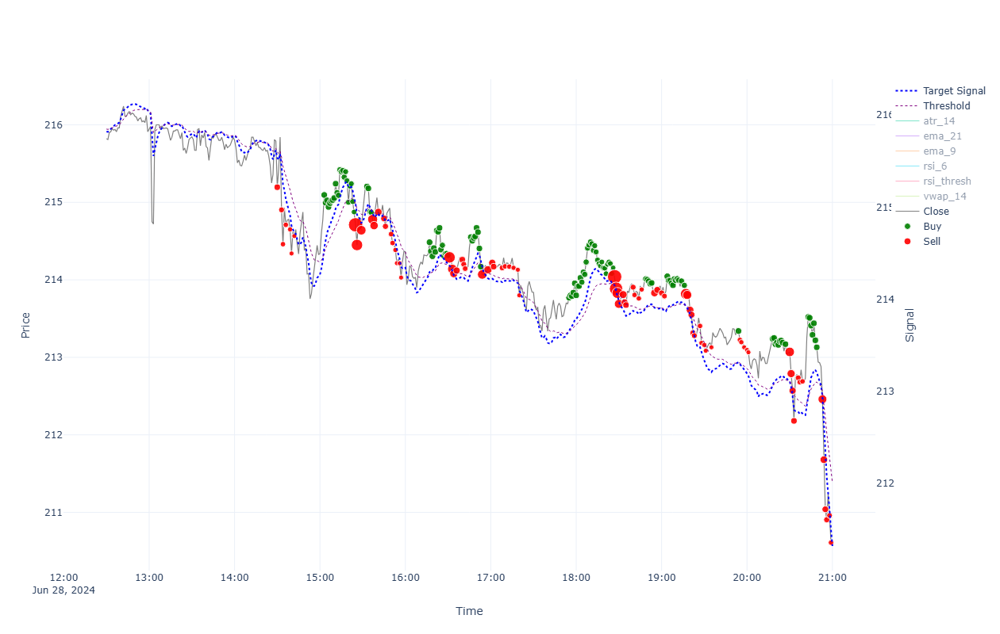


                                                  ******* Performance for 2024-06-28 *******

INTRADAY:
  shares(354); [ask_buy=215.238, fee_buy=0.004, pos_amnt_buy=76195.682]; [bid_sell=210.578, fee_sell=0.019, pos_amnt_sell=74537.902]; PNL=-1657.78
TRADES:
  Tr[1]: Time(14:30)Ask(215.238)Bid(215.152)Act(Sell)Shrs(7)Pos(15); CashTr(1505.931)=Cost(1506.064)-Fee(-0.133); P&L(60407.602)=CashTot(57180.322)+PosAmt(3227.279)
  Tr[2]: Time(14:33)Ask(214.946)Bid(214.86)Act(Sell)Shrs(5)Pos(10); CashTr(1074.204)=Cost(1074.299)-Fee(-0.095); P&L(60403.124)=CashTot(58254.526)+PosAmt(2148.597)
  Tr[3]: Time(14:34)Ask(214.503)Bid(214.417)Act(Sell)Shrs(3)Pos(7); CashTr(643.195)=Cost(643.251)-Fee(-0.057); P&L(60398.641)=CashTot(58897.721)+PosAmt(1500.92)
  Tr[4]: Time(14:36)Ask(214.752)Bid(214.667)Act(Sell)Shrs(3)Pos(4); CashTr(643.943)=Cost(644.0)-Fee(-0.057); P&L(60400.33)=CashTot(59541.664)+PosAmt(858.666)
  Tr[5]: Time(14:39)Ask(214.694)Bid(214.608)Act(Sell)Shrs(2)Pos(2); CashTr(429.178)=Cost(429

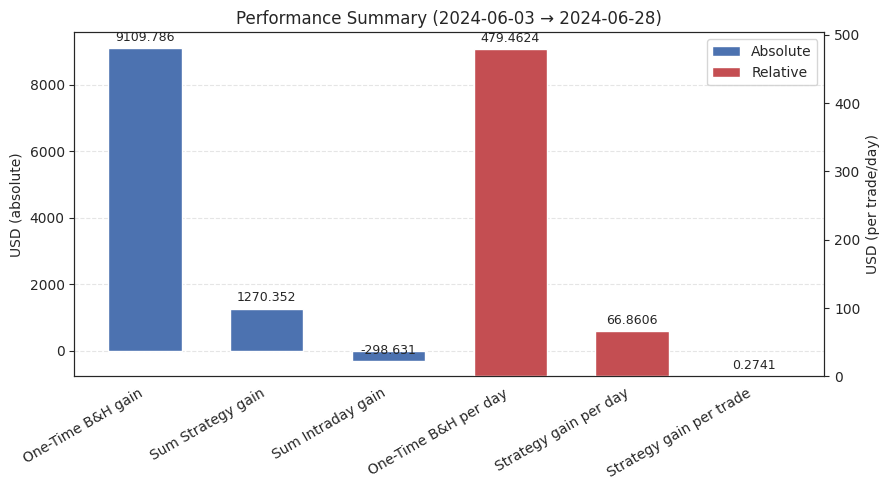


Overall Summary (2022-12-23 = 132.533 → 2025-06-18 = 196.501)
Num. trading days: 622
Trades Count: 157243
Initial capital: 100000.000

One-Time B&H gain: 48214.541 | final: 148214.541 | PnL%: 48.21%
Sum Strategy gain: -65920.587 | final: 34079.413 | PnL%: -65.92%
Sum Intraday gain: 9886.037 | final: 109886.037 | PnL%: 9.89%

One-Time B&H gain per day: 77.5153
Strategy gain per day: -105.9817
Strategy gain per trade: -0.4192


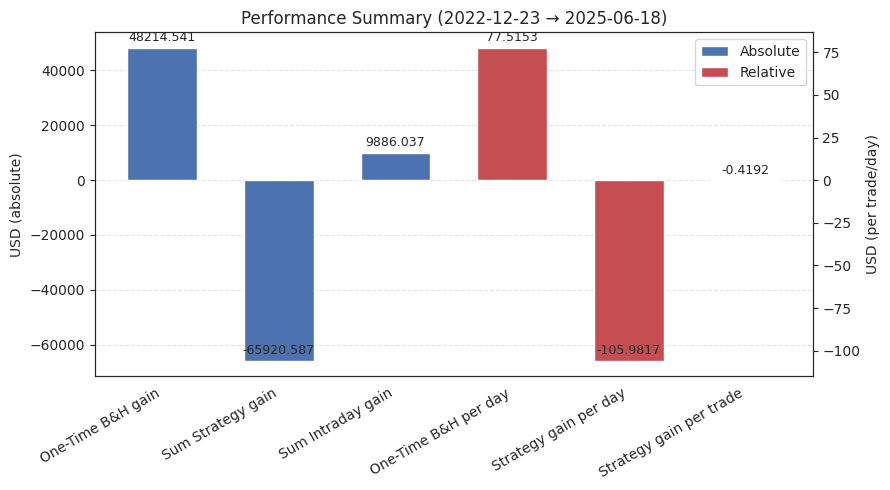


Monthly Summary 2022-12 (2022-12-23 = 132.533 → 2022-12-30 = 129.814)
Num. trading days: 5  Trades Count: 1309  Initial capital: 100000.000
One-Time B&H gain: -2066.049 | final: 97933.951 | PnL%: -2.07%
Sum Strategy gain: -1408.317 | final: 98591.683 | PnL%: -1.41%
Sum Intraday gain: -1096.061 | final: 98903.939 | PnL%: -1.10%

Monthly Summary 2023-01 (2023-01-03 = 130.906 → 2023-01-31 = 144.151)
Num. trading days: 20  Trades Count: 5370  Initial capital: 100000.000
One-Time B&H gain: 10089.666 | final: 110089.666 | PnL%: 10.09%
Sum Strategy gain: 1973.712 | final: 101973.712 | PnL%: 1.97%
Sum Intraday gain: 9271.134 | final: 109271.134 | PnL%: 9.27%

Monthly Summary 2023-02 (2023-02-01 = 143.959 → 2023-02-28 = 147.361)
Num. trading days: 19  Trades Count: 4843  Initial capital: 100000.000
One-Time B&H gain: 2345.965 | final: 102345.965 | PnL%: 2.35%
Sum Strategy gain: -1441.524 | final: 98558.476 | PnL%: -1.44%
Sum Intraday gain: 5301.958 | final: 105301.958 | PnL%: 5.30%

Monthly Su

In [5]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [day for day in sim_results if day.year == year and day.month == month]
days_all = [day for day in sim_results]

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day_plot, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df                 = df_day_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            trades             = trades_day,
            performance_stats  = stats_day,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            start_plot         = params.sess_start_shift,
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {day.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_day.items(): # Print stats_day dict nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "-"*150 + "\n")

# monthly / overall aggregates
plots.aggregate_performance(df = df_month, 
                            perf_list = [sim_results[day][2] for day in sorted(days_in_month)])
plots.aggregate_performance(df = df_inds_test,
                            perf_list = [sim_results[day][2] for day in sorted(days_all)])


In [6]:
# ONE test — run in backtest notebook (copy exactly)
import numpy as np
from libs import plots

# reproduce the per-day strategy list you already used
perf_list = [sim_results[d][2] for d in sorted(sim_results)]
strategy_list = np.array([plots._parse_eq_value(p["STRATEGY"]) for p in perf_list])

optuna_value = -104.9032

def show(name, arr):
    s = float(np.sum(arr))
    m64 = float(np.mean(arr))
    m32 = float(np.mean(arr.astype(np.float32)))
    m_no_nan = float(np.nanmean(arr))
    print(f"{name}: sum={s:.12f}, mean(float64)={m64:.12f}, mean(float32)={m32:.12f}, nanmean={m_no_nan:.12f}")

print("Counts: len(strategy_list) =", len(strategy_list), "  NaNs:", int(np.isnan(strategy_list).sum()))
show("original", strategy_list)

# common rounding/formatting variants
print("\nRounded variants:")
print("round(mean, 4) =", round(float(np.mean(strategy_list)), 4))
print("round(mean, 3) =", round(float(np.mean(strategy_list)), 3))
print("formatted 4-decimals:", f"{float(np.mean(strategy_list)):.4f}")

# difference to Optuna value
print("\nOptuna value:", optuna_value)
print("difference (optuna - mean64) =", float(optuna_value - float(np.mean(strategy_list))))
print("difference (optuna - mean32) =", float(optuna_value - float(np.mean(strategy_list.astype(np.float32)))))
print("difference (optuna - round(mean,4)) =", float(optuna_value - round(float(np.mean(strategy_list)), 4)))


Counts: len(strategy_list) = 622   NaNs: 0
original: sum=-65920.587000000000, mean(float64)=-105.981651125402, mean(float32)=-105.981651306152, nanmean=-105.981651125402

Rounded variants:
round(mean, 4) = -105.9817
round(mean, 3) = -105.982
formatted 4-decimals: -105.9817

Optuna value: -104.9032
difference (optuna - mean64) = 1.0784511254019264
difference (optuna - mean32) = 1.0784513061523455
difference (optuna - round(mean,4)) = 1.0785000000000053
